# DDPLKO Moduł 8 - praca domowa - Analiza działania modelu

To ósma praca domowa w Programie szkoleniowym Klasyfikacja obrazu od Deep Drive PL

Twoim zadaniem w tym module będzie - w zależności od dostępnej mocy obliczniowej:
1. Na bazie pracy domowej z Transfer learningiem, data augmentation
2. Na bazie pracy domowej ze zbiorem **QuickDraw**

Wykonanie dla próbek w których model się pomylił podczas predykcji:
- [ ] Wizualizacji Occlusion sensitivy
- [ ] oraz GradCAM/Guided GradCAM
- [ ] Udostępnij przykładowy wynik na Discordzie `#klasyfikacja-wyniki` (wystarczy dla 1 zdjęcia)

Możesz extra (czyli opcjonalne rzeczy):
- Zwizualizować zbiór Val wykorzystując t-SNE/UMAP/MDE

In [1]:
import torch
import cv2
import matplotlib.pyplot as plt
import numpy as np
from torchvision import transforms
import os
from pathlib import Path

from captum.attr import Occlusion
from captum.attr import visualization as viz

from captum.attr import LayerGradCam, LayerAttribution, GuidedGradCam

### Loading model

In [13]:
model = torch.load('./effnetv2_pretrained_aug.pth')
model.eval()

### Dataset

In [2]:
data_dir = Path('./mistakes/')
classes = sorted([cls for cls in os.listdir('/home/jakub/Documents/deep_learning_course/weather_classification')])

In [55]:
imgs = [cv2.imread(str(data_dir / img)) for img in os.listdir(data_dir)]
imgs = [cv2.cvtColor(img, cv2.COLOR_BGR2RGB) for img in imgs]

In [56]:
input_batch = np.array(imgs)

In [57]:
input_batch = (torch.Tensor(input_batch)/255).permute(0, 3, 1, 2)
input_batch = input_batch.to(torch.device('cuda'))

In [58]:
labels = np.array([classes.index(img.split('_')[0]) for img in os.listdir(data_dir)])
labels = torch.Tensor(labels).long()
labels = labels.to(torch.device('cuda'))

# Occlusion sensitivity

In [53]:
strides = (1, 40, 40)
sliding_window_shapes = (1, 100, 100)
baselines = 0

In [61]:
occlusion = Occlusion(model)
attributions = occlusion.attribute(input_batch,
                                  strides=strides,
                                  target=labels,
                                  sliding_window_shapes=sliding_window_shapes,
                                  baselines=baselines,
                                  show_progress=True)


Occlusion attribution: 100%|████████████████████| 49/49 [00:00<00:00, 64.00it/s]


In [62]:
attributions.shape, attributions.dtype

(torch.Size([8, 3, 192, 192]), torch.float32)

In [131]:
methods = {'methods': ['original_image', 'heat_map', 'blended_heat_map', 'masked_image', 'alpha_scaling'],
           'titles': ['Original', 'Heatmap', 'Blended heatmap', 'Masked image', 'Alpha scaling']}
signs_absolute = {'signs': ['all', 'absolute_value', 'absolute_value', 'absolute_value', 'absolute_value']} 

plot_kwargs = {'show_colorbar': True,
               'fig_size': (30,10)}

GT: cloudy, Pred: haze.png


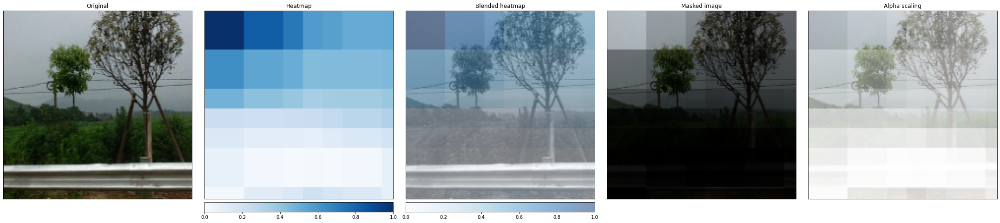

GT: rainy, Pred: cloudy.png


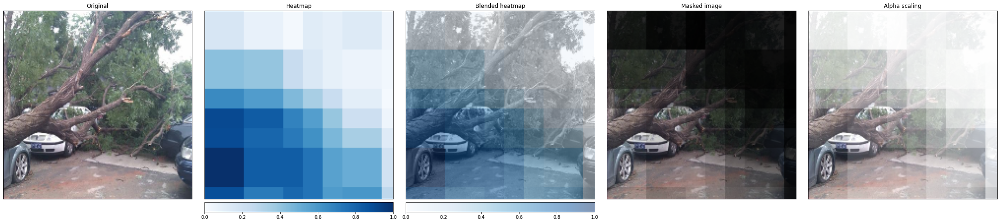

GT: thunder, Pred: sunny.png


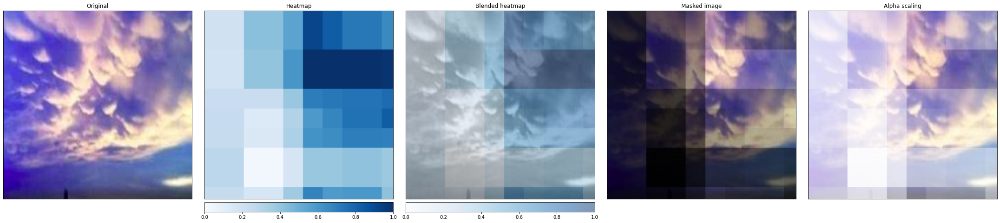

GT: haze, Pred: rainy.png


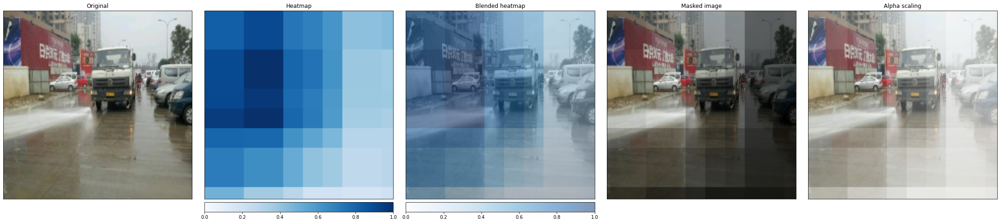

GT: cloudy, Pred: rainy.png


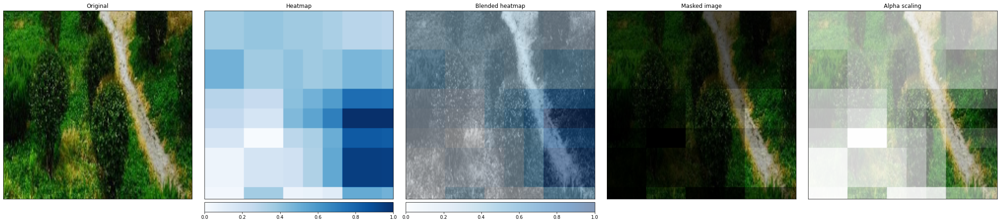

GT: rainy, Pred: haze.png


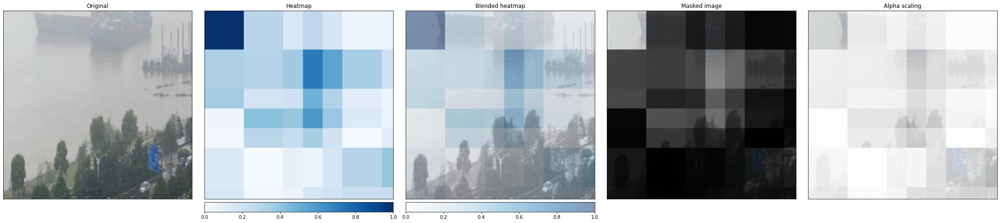

GT: cloudy, Pred: snow.png


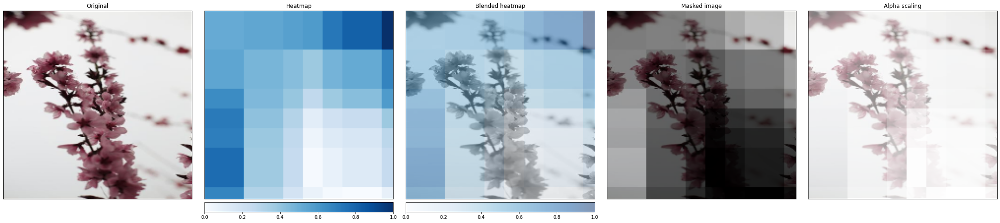

GT: sunny, Pred: cloudy.png


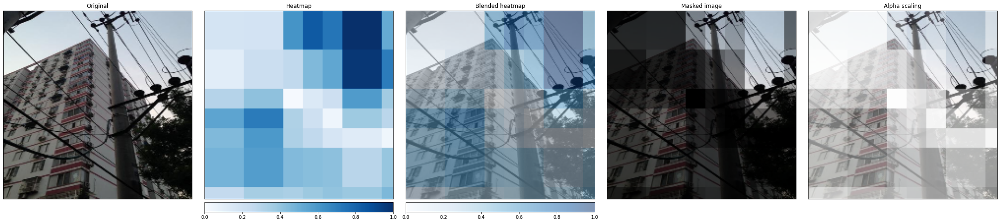

In [133]:
for idx, img in enumerate(attributions):
    image = img.cpu().detach().numpy().squeeze().transpose(1, 2, 0)
    gt = os.listdir(data_dir)[idx].split('_')[0]
    pred = os.listdir(data_dir)[idx].split('_')[1]
    org_image = imgs[idx]
    print(f'GT: {gt}, Pred: {pred}')
    _ = viz.visualize_image_attr_multiple(image, org_image, **methods, **signs_absolute, **plot_kwargs)
    

# GradCAM

In [146]:
model

EfficientNet(
  (conv_stem): Conv2dSame(3, 32, kernel_size=(3, 3), stride=(2, 2), bias=False)
  (bn1): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  (act1): SiLU(inplace=True)
  (blocks): Sequential(
    (0): Sequential(
      (0): ConvBnAct(
        (conv): Conv2d(32, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(16, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
        (act1): SiLU(inplace=True)
      )
    )
    (1): Sequential(
      (0): EdgeResidual(
        (conv_exp): Conv2dSame(16, 64, kernel_size=(3, 3), stride=(2, 2), bias=False)
        (bn1): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
        (act1): SiLU(inplace=True)
        (se): Identity()
        (conv_pwl): Conv2d(64, 32, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn2): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): 

In [147]:
gradcam = LayerGradCam(model, model.act2)
attributions_ = gradcam.attribute(input_batch, target=labels)
attributions_.shape

torch.Size([8, 1, 6, 6])

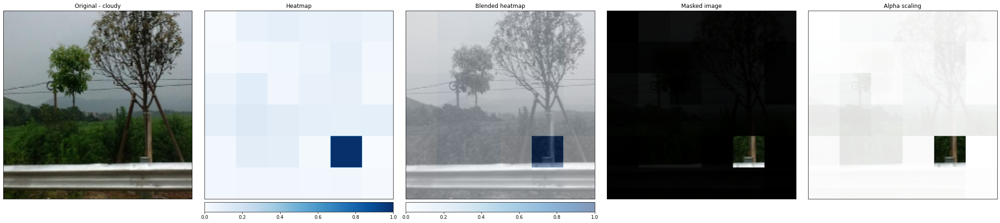

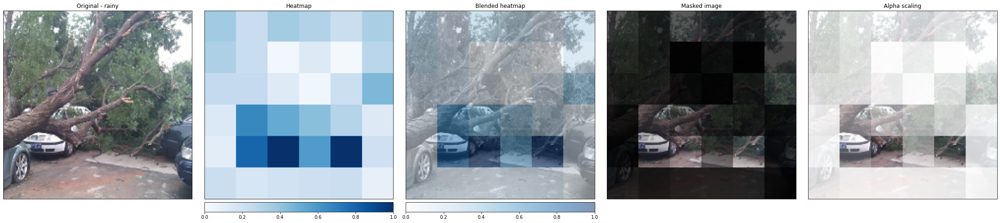

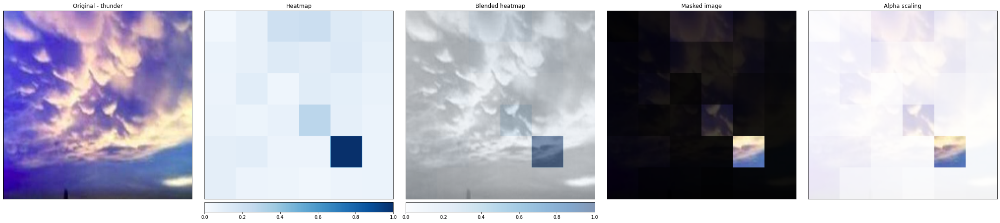

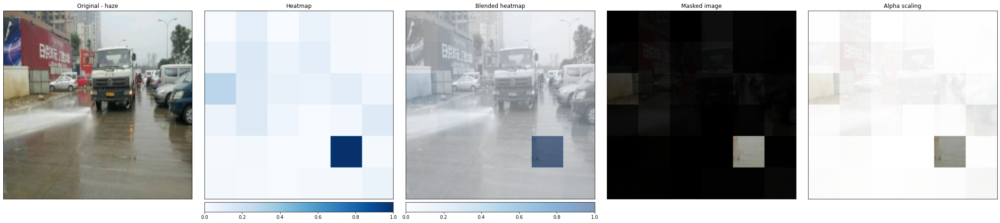

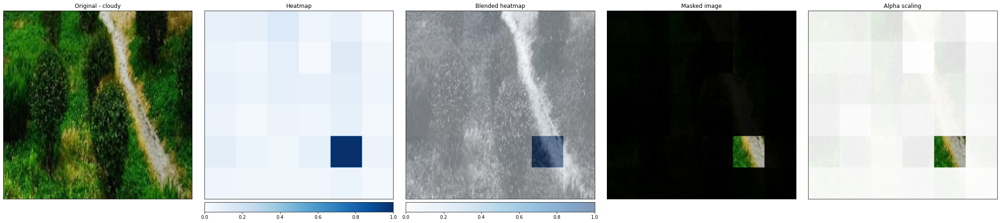

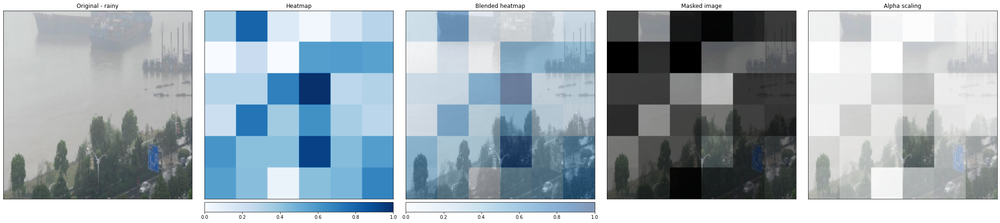

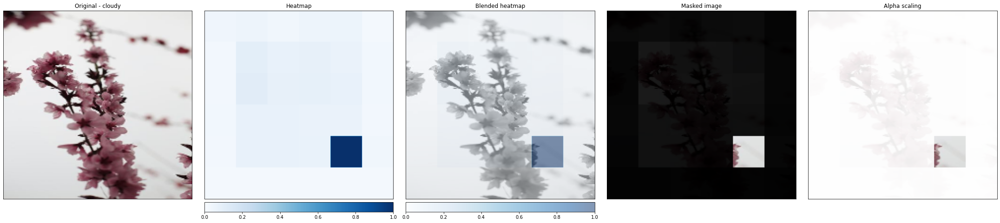

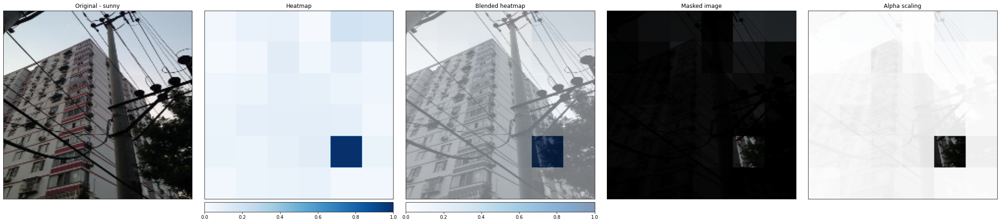

In [171]:
signs_absolute = {'signs': ['all', 'absolute_value', 'absolute_value', 'absolute_value', 'absolute_value']} #absolute value of attributions
titles = ['Heatmap', 'Blended heatmap', 'Masked image', 'Alpha scaling']
plot_kwargs = {'show_colorbar': True, 'fig_size': (30,10)}
methods = {'methods': ['original_image', 'heat_map', 'blended_heat_map', 'masked_image', 'alpha_scaling']}

for idx, attr in enumerate(attributions_):
    image = imgs[idx]
    attributions = LayerAttribution.interpolate(attr.unsqueeze(dim=0), (image.shape[0], image.shape[1]))
    attributions = np.transpose(attributions.squeeze(dim=0).cpu().detach().numpy(), (1, 2, 0))
    viz.visualize_image_attr_multiple(attributions, image, **methods, **signs_absolute, **plot_kwargs, titles=['Original - ' + str(classes[int(labels[idx].cpu())]), *titles]);

# Summary / extra

## Custom Occlusion sensitivy

In [3]:
import cv2
import matplotlib.pyplot as plt

In [1]:
def show_img(path):
    image = cv2.imread(path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (224, 224))
    
    plt.figure(figsize=(9, 9))
    plt.imshow(image)
    plt.axis('off')
    
    return image

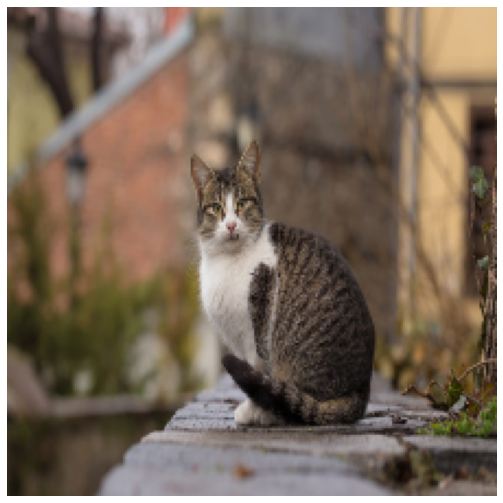

In [2]:
img = show_img('pexels-anton-atanasov-800152.jpg')

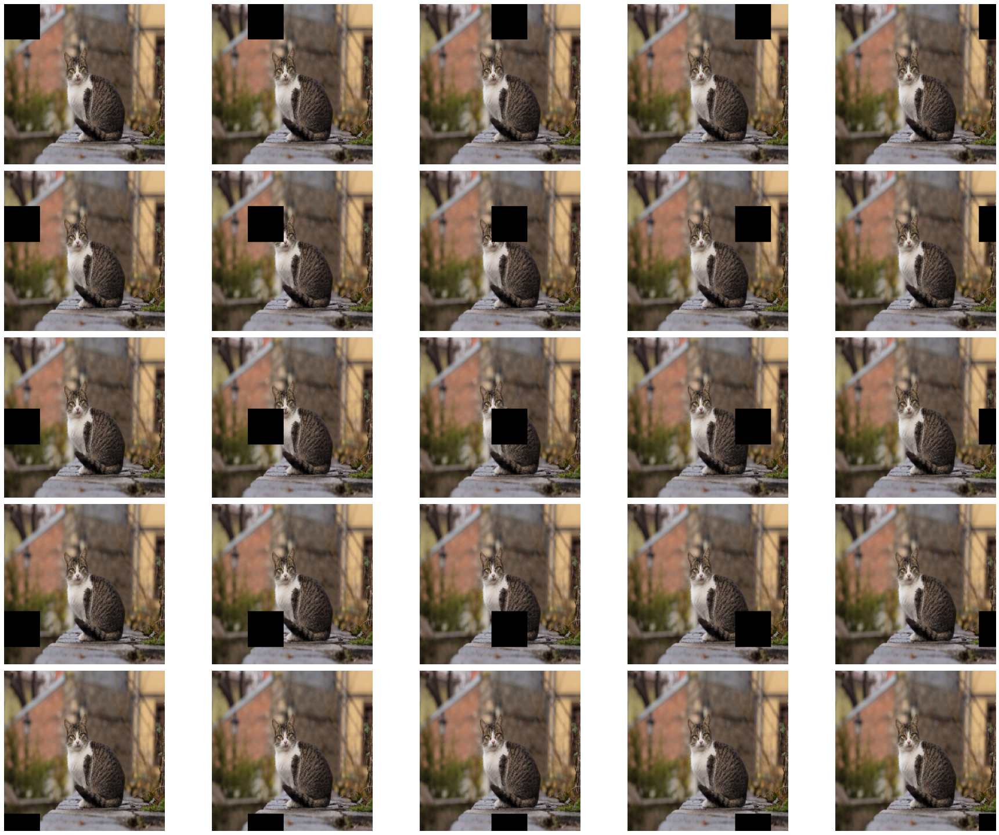

In [3]:
patch_size = 50
stride = 50
occ_value = 0
plt.figure(figsize=(25, 40))

current_pos = 1
for i in range(0, img.shape[0], stride):
    for j in range(0, img.shape[1], stride):
        img_ = img.copy()
        img_[i:i+patch_size, j:j+patch_size] = occ_value
        plt.subplot(10, 5, current_pos)
        plt.imshow(img_)
        current_pos += 1
        plt.axis('off')
plt.tight_layout()

In [4]:
import torch
from torchvision.models import resnet50
from torchvision import transforms
import numpy as np

In [5]:
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406], 
        std=[0.229, 0.224, 0.225])
])

In [12]:
model = resnet50(pretrained=True)

def scale(val, src, dst):
    """
    Scale the given value from the scale of src to the scale of dst.
    """
    return ((val - src[0]) / (src[1]-src[0])) * (dst[1]-dst[0]) + dst[0]

def occlusion_sens(img, model):
    model.eval()
    imgs = []
    patch_size = 50
    
    stride = 50
    occ_value = 0
    
    for i in range(0, img.shape[0], stride):
        for j in range(0, img.shape[1], stride):
            img_ = img.copy()
            img_[i:i+patch_size, j:j+patch_size] = occ_value
            imgs.append(img_)
    
    test_batch = torch.stack([transform(img) for img in imgs], dim=0)
    
    out = model(test_batch)
    
    pred = np.max(out.detach().numpy(), axis=1)
    
    test_img = transform(img).unsqueeze(dim=0)
    original_img = model(test_img)
    org_result = np.max(original_img.detach().numpy())    
    
    pred_norm = pred / org_result    
    
    negative = np.where(pred_norm > 1, pred_norm, -pred_norm/min(pred_norm)) 
    negative2 = negative * np.asarray(negative < 1)
    negative2[np.asarray(pred_norm>1)] = pred_norm[np.asarray(pred_norm>1)]    
    test_results = np.where(negative2 < 1, negative2, negative2/max(negative2))    
    
    old_min = min(test_results[np.where(test_results>0)])
    old_max = max(test_results[np.where(test_results>0)])
    new_min = 0
    new_max = 1
    neg_scale = (min(test_results), max(test_results[np.where(test_results<0)]), 0, -1)
    
    results = np.where(test_results<0, test_results, scale(test_results, [old_min, old_max], [new_min, new_max]))  
    results = np.where(results>0, results, scale(results, [neg_scale[0], neg_scale[1]], [neg_scale[2], neg_scale[3]]))
    results[0] = 0
    
    box_pos = 0
    new_img = np.zeros(shape=img.shape)
    for i in range(0, img.shape[0], stride):
        for j in range(0, img.shape[1], stride):
            if results[box_pos] > 0:
                g = 1 - results[box_pos]
                new_img[i:i+patch_size, j:j+patch_size, 0] = g
                plt.plot()

            elif results[box_pos] < 0:
                r = 1 - results[box_pos]
                new_img[i:i+patch_size, j:j+patch_size, 1] = r
            box_pos += 1
            
    plt.imshow(img)
    plt.imshow(new_img, alpha=0.2)
    plt.axis('off')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


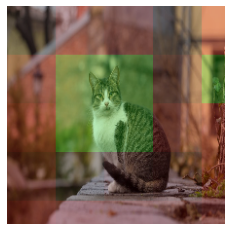

In [13]:
occlusion_sens(img, model)

## t-distributed Stochastic Neighbor Embedding (t-SNE)¶visualization


In [5]:
from sklearn.manifold import TSNE
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

from torchvision.io import read_image
from torch.utils.data import Dataset
from torchvision import transforms
from torch.utils.data import DataLoader

import timm

from tqdm import tqdm
import seaborn as sns

In [6]:
# Dataset
data_dir = Path('/home/jakub/Documents/deep_learning_course/weather_classification')
classes = sorted(os.listdir(data_dir))

In [7]:
# Dataset split
images = []
labels = []
for cls in classes:
    for img in os.listdir(data_dir / cls):
        images.append(img)
        labels.append(cls)
        
X_train, X_testval, y_train, y_testval = train_test_split(images, labels, test_size=0.3, random_state=42,
                                                         stratify=labels)
X_test, X_val, y_test, y_val = train_test_split(X_testval, y_testval, test_size=0.5, random_state=42,
                                               stratify=y_testval)

assert len(set(y_val)) == len(set(y_train)) == len(set(y_test))

le = LabelEncoder()
le.fit(classes)
classes = le.classes_.tolist()

y_train = le.transform(y_train)
y_test = le.transform(y_test)
y_val = le.transform(y_val)

annotations = {'train': {'images': X_train,
                        'labels': y_train,
                        'classes': classes},
              
               'test': {'images': X_test,
                        'labels': y_test,
                        'classes': classes},
              
               'val': {'images': X_val,
                        'labels': y_val,
                        'classes': classes}}

In [8]:
class CustomDataset(Dataset):
    def __init__(self, annotations:dict, img_dir:Path, transform=None, target_transform=None):
        self.annotations=annotations
        self.img_dir=img_dir
        self.transform=transform
        self.target_transform=target_transform
        self.classes = annotations['classes']
        
    def __len__(self):
        return len(self.annotations['images'])

    def __getitem__(self, idx):
        img_cat = self.annotations['images'][idx].split('_')[0]
        img_path = str(self.img_dir / img_cat / self.annotations['images'][idx])
        image = read_image(img_path)
        image = image / 255.0
        label = self.classes.index(img_cat)
        
        if self.transform:
            image = self.transform(image)
            
        if self.target_transform is not None:
            label = self.target_transform([label]).to(torch.long)
            
        return image, label

In [9]:
input_size=(192, 192)

img_transforms = transforms.Compose([
    transforms.Resize(input_size),
])

val_dataset = CustomDataset(annotations['val'],
                           img_dir=data_dir,
                           transform=img_transforms)

In [9]:
# Define model without classifier
device = torch.device('cuda')
model = timm.create_model('tf_efficientnetv2_b0', pretrained=True, num_classes=0)

In [10]:
model

EfficientNet(
  (conv_stem): Conv2dSame(3, 32, kernel_size=(3, 3), stride=(2, 2), bias=False)
  (bn1): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  (act1): SiLU(inplace=True)
  (blocks): Sequential(
    (0): Sequential(
      (0): ConvBnAct(
        (conv): Conv2d(32, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(16, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
        (act1): SiLU(inplace=True)
      )
    )
    (1): Sequential(
      (0): EdgeResidual(
        (conv_exp): Conv2dSame(16, 64, kernel_size=(3, 3), stride=(2, 2), bias=False)
        (bn1): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
        (act1): SiLU(inplace=True)
        (se): Identity()
        (conv_pwl): Conv2d(64, 32, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn2): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): 

In [11]:
test_img = torch.randn([1, 3, 192, 192])
out_size = model(test_img).shape[-1]

In [11]:
def get_embeddings(model, dataset, out_size):
    device = torch.device('cuda')
    model.to(device)
    batch_size=32
    
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=True,
                           num_workers=2)
    embeddings = np.zeros((len(dataset), out_size))
    y = np.zeros(len(dataset))
    
    for idx, (data, target) in enumerate(tqdm(val_loader)):
        data = data.to(device)
        embeddings[idx*batch_size:(idx+1)*batch_size] = model(data).cpu().detach().numpy()
        y[idx*batch_size:(idx+1)*batch_size] = target.numpy()
    
    return embeddings, y

In [59]:
embeddings, y = get_embeddings(model=model,
                              dataset=val_dataset,
                              out_size=out_size)

100%|█████████████████████████████████████████| 267/267 [00:17<00:00, 15.40it/s]


In [ ]:
tsne_results = TSNE().fit_transform(embeddings)

In [19]:
labels = [val_dataset.classes[int(label)] for label in y]

<AxesSubplot:>

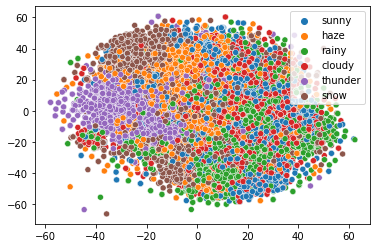

In [79]:
sns.scatterplot(x=tsne_results[:, 0], y=tsne_results[:, 1], hue=labels)

<AxesSubplot:>

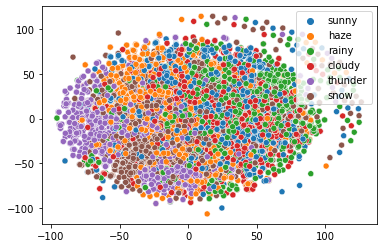

In [80]:
tsne_results = TSNE(perplexity=2).fit_transform(embeddings)
sns.scatterplot(x=tsne_results[:, 0], y=tsne_results[:, 1], hue=labels)

<AxesSubplot:>

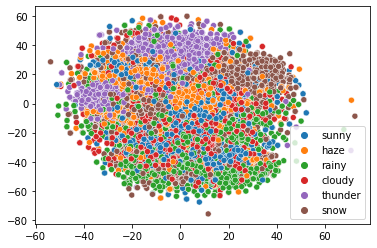

In [81]:
tsne_results = TSNE(perplexity=30).fit_transform(embeddings)
sns.scatterplot(x=tsne_results[:, 0], y=tsne_results[:, 1], hue=labels)

<AxesSubplot:>

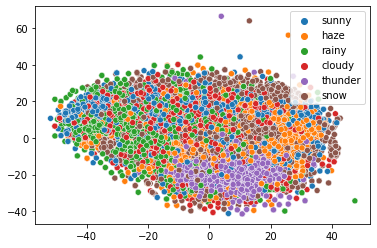

In [82]:
tsne_results = TSNE(perplexity=50).fit_transform(embeddings)
sns.scatterplot(x=tsne_results[:, 0], y=tsne_results[:, 1], hue=labels)

## With model trained on the dataset

In [12]:
del model
torch.cuda.empty_cache()
model = torch.load('./effnetv2_pretrained_aug.pth')

In [13]:
trained_state_dict = model.state_dict()

In [14]:
# Remove classifier's weights
trained_state_dict.pop('classifier.weight')
trained_state_dict.pop('classifier.bias')

tensor([ 0.6749,  0.4654, -0.2153, -0.4954,  0.0565, -1.1421], device='cuda:0')

In [15]:
# Define model without classifier
device = torch.device('cuda')
model = timm.create_model('tf_efficientnetv2_b0', pretrained=True, num_classes=0)

model.load_state_dict(trained_state_dict)

<All keys matched successfully>

In [16]:
test_img = torch.randn([1, 3, 192, 192])
out_size = model(test_img).shape[-1]

In [17]:
embeddings, y = get_embeddings(model=model,
                              dataset=val_dataset,
                              out_size=out_size)

100%|█████████████████████████████████████████| 267/267 [00:18<00:00, 14.62it/s]


<AxesSubplot:>

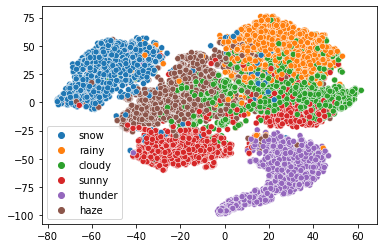

In [20]:
tsne_results = TSNE().fit_transform(embeddings)
sns.scatterplot(x=tsne_results[:, 0], y=tsne_results[:, 1], hue=labels)

<AxesSubplot:>

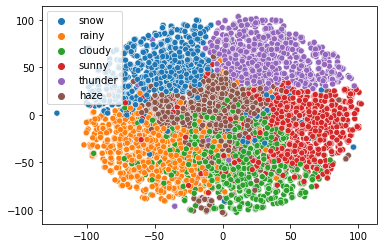

In [21]:
tsne_results = TSNE(perplexity=2).fit_transform(embeddings)
sns.scatterplot(x=tsne_results[:, 0], y=tsne_results[:, 1], hue=labels)

<AxesSubplot:>

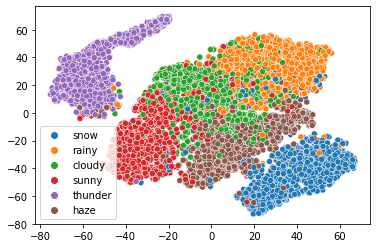

In [22]:
tsne_results = TSNE(perplexity=30).fit_transform(embeddings)
sns.scatterplot(x=tsne_results[:, 0], y=tsne_results[:, 1], hue=labels)

<AxesSubplot:>

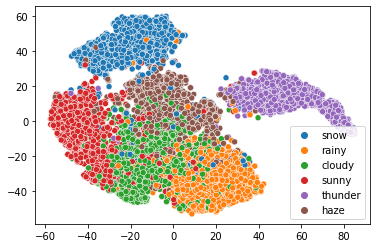

In [23]:
tsne_results = TSNE(perplexity=50).fit_transform(embeddings)
sns.scatterplot(x=tsne_results[:, 0], y=tsne_results[:, 1], hue=labels)

# Wyślij rozwiązanie
Możesz skorzystać z jednego z poniższych sposobów:
**mailem na specjalny adres** ze strony pracy domowej w panelu programu prześlij jedno z poniższych:
- notebooka (jeżeli plik ma mniej niż np. 10MB)
- notebooka w zipie
- link do Colaba (udostępniony)
- link do pliku przez GDrive/Dropboxa/WeTransfer/...
- pdfa (poprzez download as pdf)
- jako plik w repozytorium na np. GitHubie, by budować swoje portfolio (wtedy uważaj na wielkość pliku, najlepiej kilka MB, Max 25MB)

Najlepiej, by w notebooku było widać wyniki uruchomienia komórek, chyba, że przez nie plik będzie mieć 100+MB wtedy najlepiej Colab lub jakieś przemyślenie co poszło nie tak (zbyt dużo dużych zdjęć wyświetlonych w komórkach).

## Co otrzymasz?
Informację zwrotną z ewentualnymi sugestiami, komentarzami.